#### Bibliotecas

In [44]:
import PIL
import cv2
import pytesseract
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

In [15]:
#https://stackoverflow.com/questions/28816046/
#displaying-different-images-with-actual-size-in-matplotlib-subplot
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

#### Recuperando as imagens c/ PILLOW

In [3]:
im_file = 'data/page_01.jpg'

In [8]:
image = Image.open(im_file)
image.show()
#para salvar imagens com pillow usamos:
image.save('path')

#### Recuperando as imagens c/ OPENCV

In [21]:
image_file = 'data/page_01.jpg'
img = cv2.imread(image_file)
#para salvar as imagens com OPENCV usamos:
cv2.imwrite('nome.extensao', arquivonotemp)

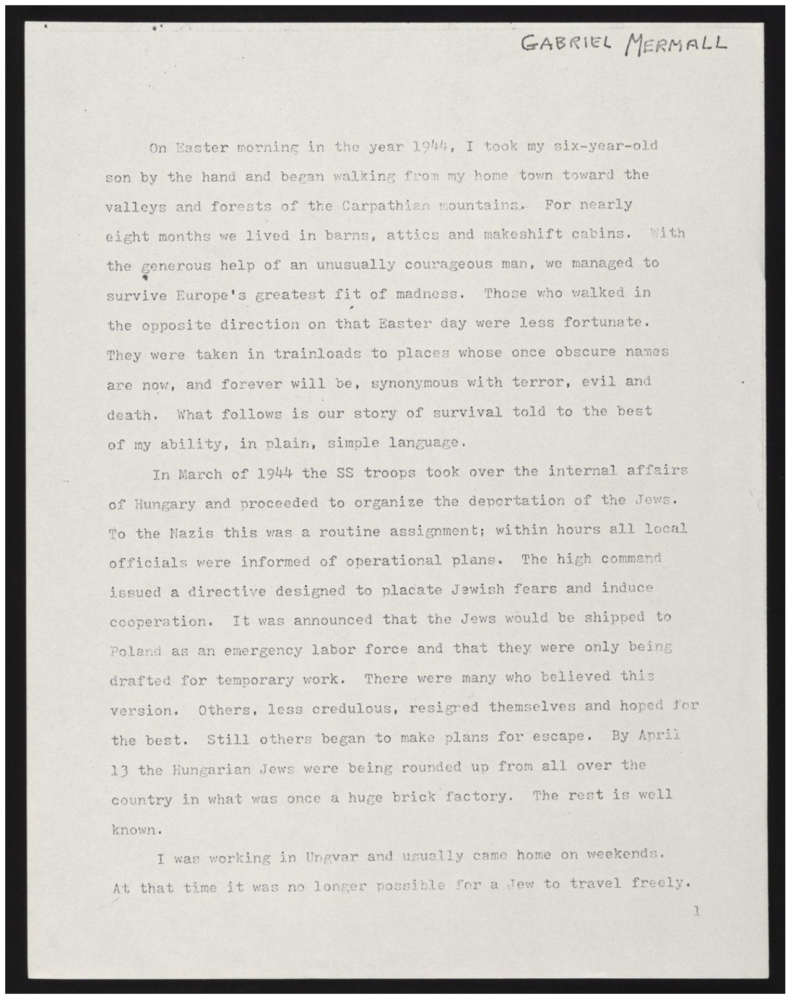

In [23]:
#Visualizando a imagem com a função criada anteriormente
display(image_file)

## Pré-processamento das imagens

1. Inverted images - Inversão de elementos da matriz de entrada<br>
bitwise operations = operações bit a bit são usadas na manipulação de imagens e usadas para extrair partes essenciais da imagem. 

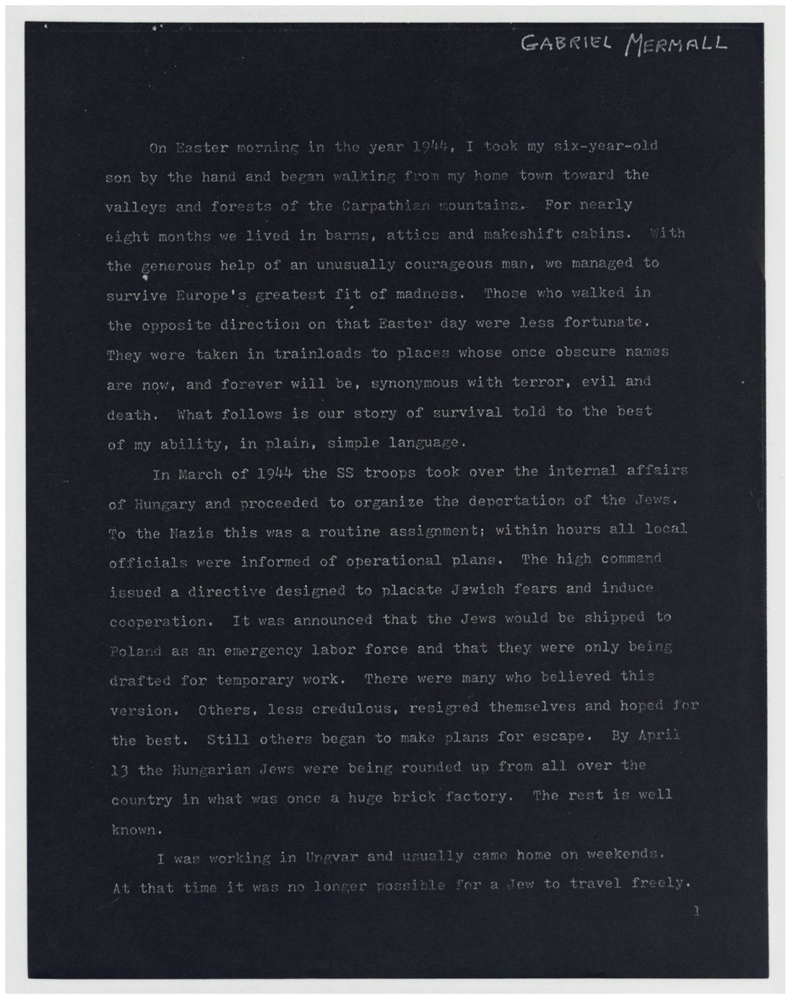

In [41]:
inverted_image = cv2.bitwise_not(img)
cv2.imwrite('inverted.jpg', inverted_image)
display('inverted.jpg')

2. Rescaling: 

3. Binarization - Convertendo a imagem para preto e branco

In [39]:
#Convertendo para escala de cinza
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

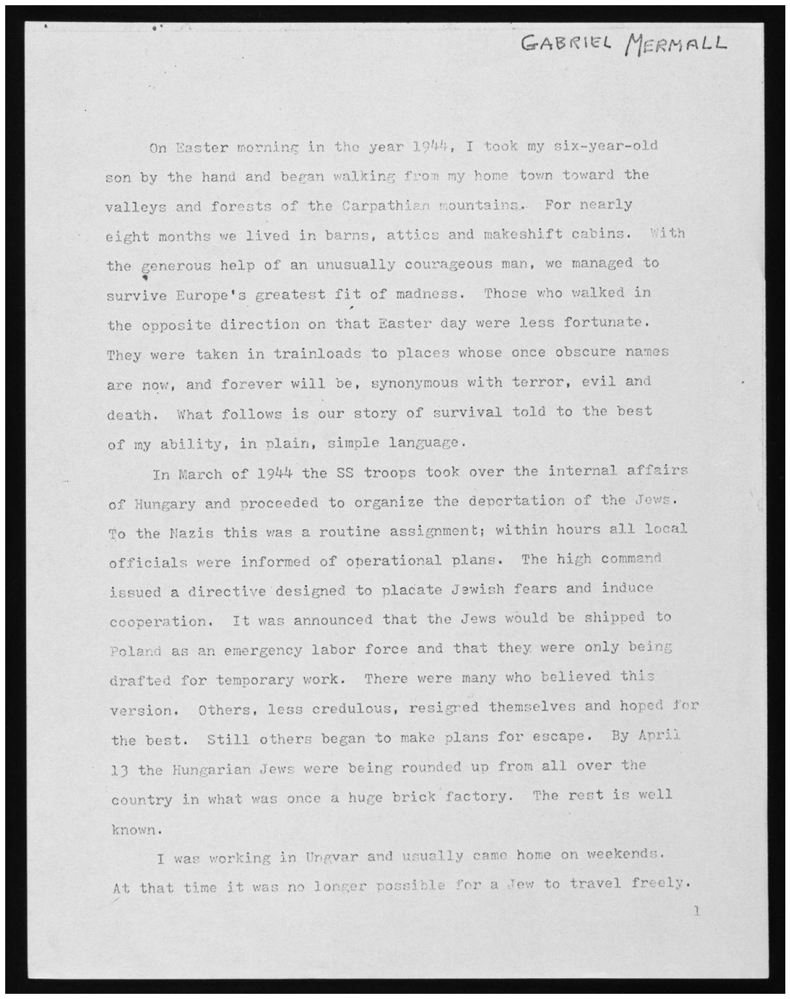

In [40]:
gray_image = grayscale(img)
cv2.imwrite('gray.jpg', gray_image)
display('gray.jpg')

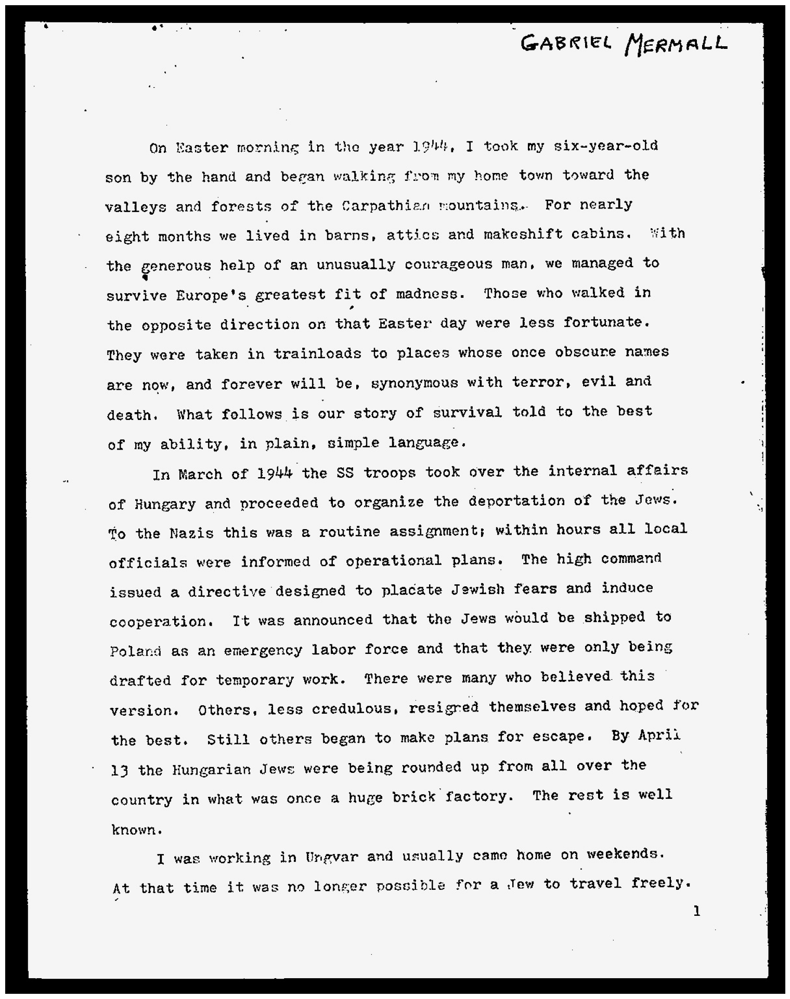

In [43]:
#terminando de binarizar e realmente colocando em preto e branco
thresh, im_bw = cv2.threshold(gray_image, 200, 230, cv2.THRESH_BINARY)
cv2.imwrite('bw_image.jpg', im_bw)
display('bw_image.jpg')

4. Noise removing - Removendo 'sujeiras', pixels que podem ser confundidos pelo modelo como letras ou pixels que podem atrabalhar o modelo a reconhecer corretamente as letras

In [75]:
def noise_removal(image):
    kernel = np.ones((1,1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1,1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return image

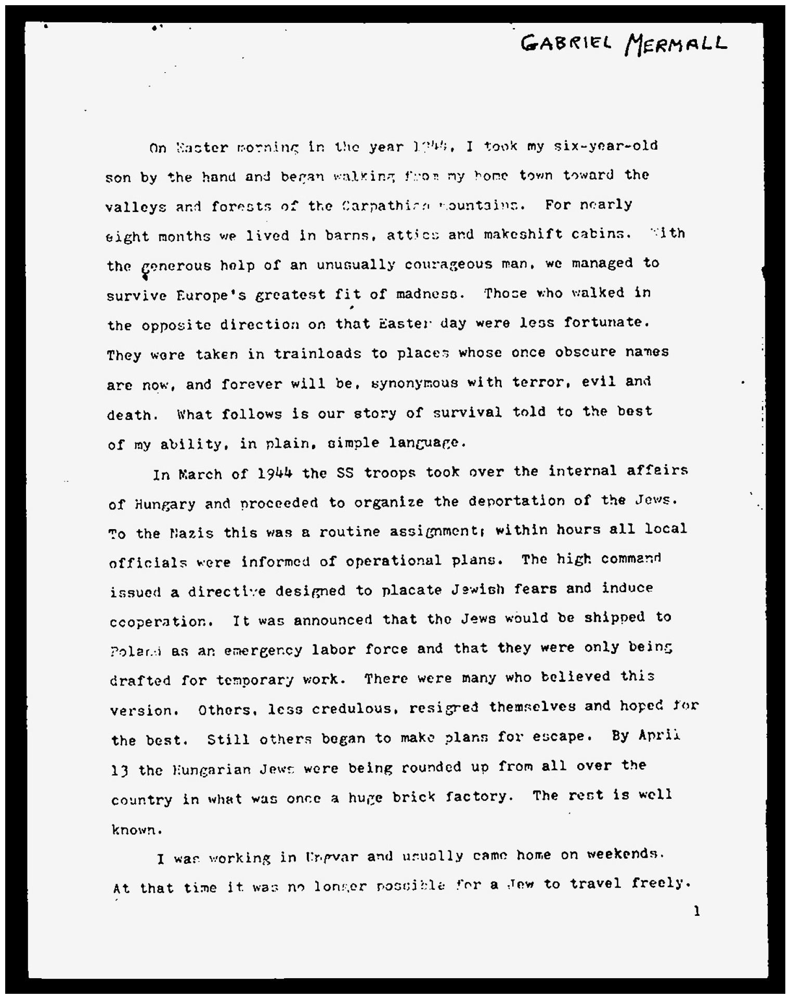

In [76]:
no_noise = noise_removal(im_bw)
cv2.imwrite('no_noise.jpg', no_noise)
display('no_noise.jpg')

#### As imagens deve estão com o background em branco e as letras em preto nessas operações morfologicas
5. Erosão - Região branca diminui na imagem

In [85]:
def thin_font(image):
    image = cv2.bitwise_not(image)
    kernel = np.ones((1,1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return image

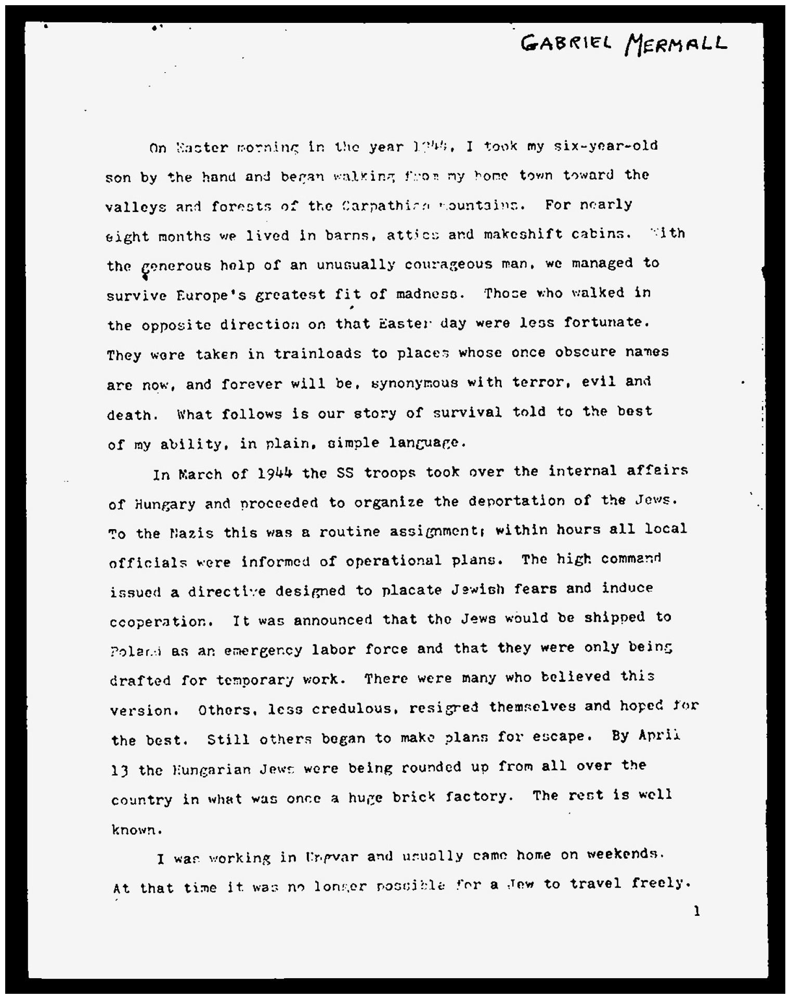

In [86]:
eroded_image = thin_font(no_noise)
cv2.imwrite('eroded_image.jpg', eroded_image)
display('eroded_image.jpg')

6. Dilatação - Aumenta a região branca na imagem

In [77]:
def thick_font(image):
    image = cv2.bitwise_not(image)
    kernel = np.ones((3,3), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return image

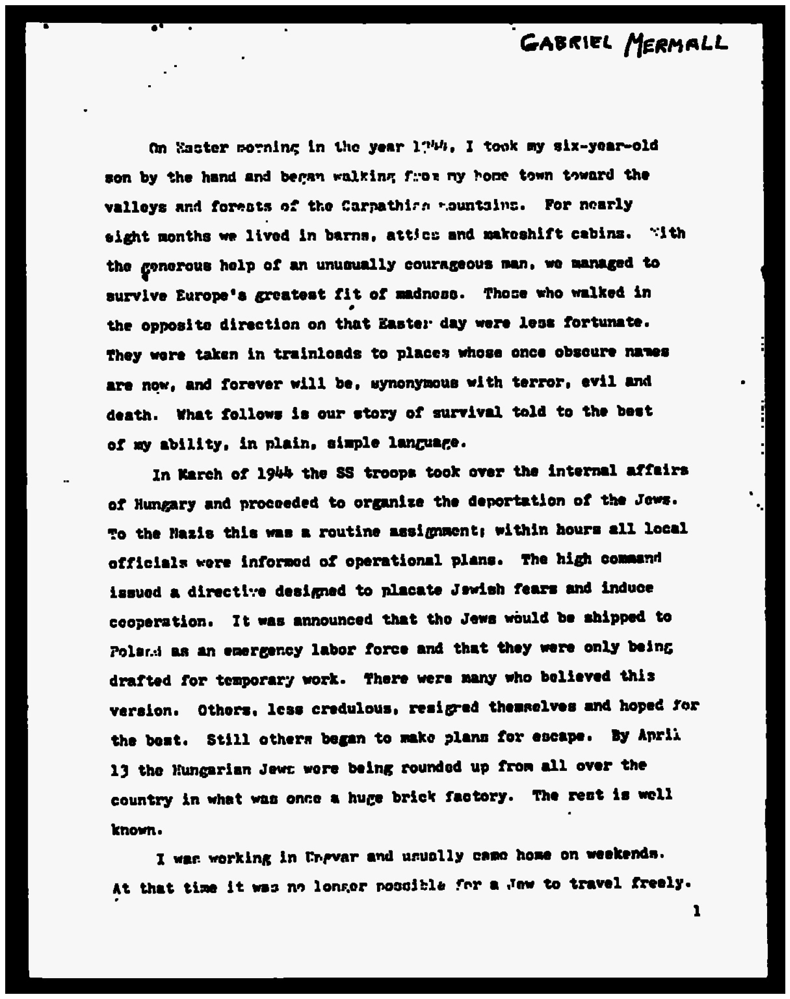

In [78]:
dilated_image = thick_font(no_noise)
cv2.imwrite('dilated_image.jpg', dilated_image)
display('dilated_image.jpg')

7. Rotation / Deskewing - OCR necessita que as imagens estejam verticalmente alinhadas

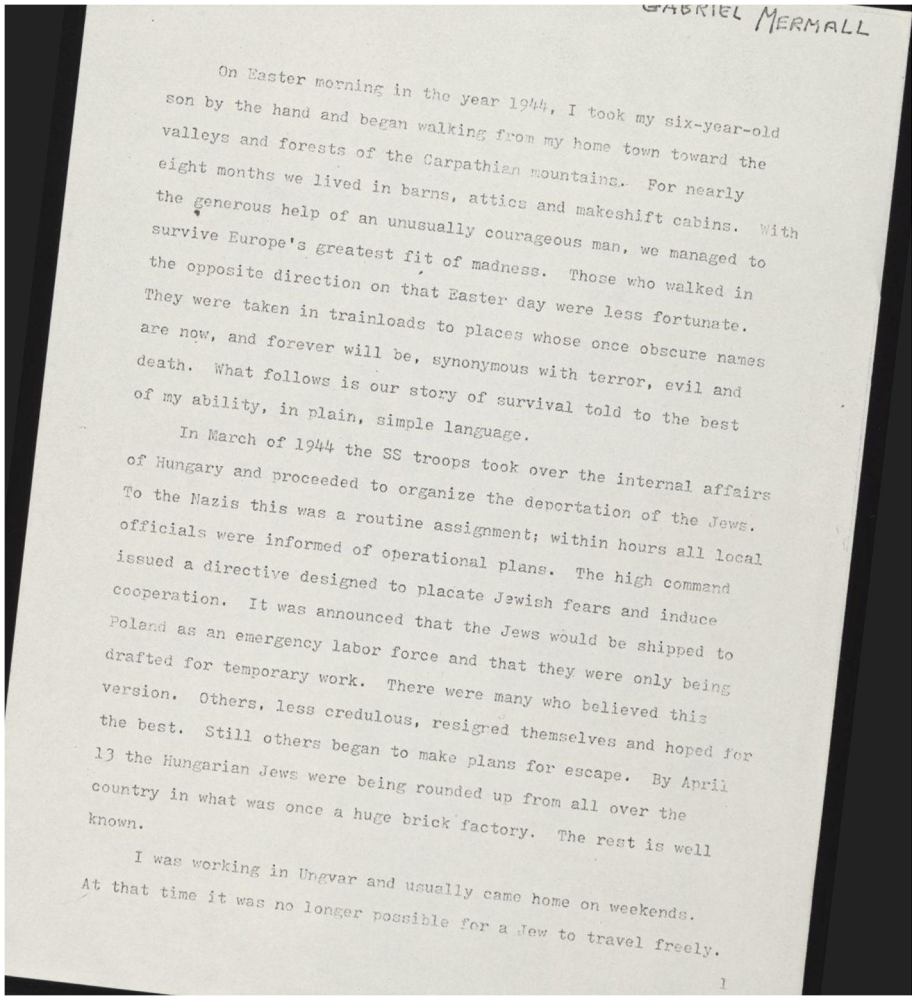

In [88]:
image_file = 'data/page_01_rotated_01.jpg'
image = cv2.imread(image_file)
display(image_file)

In [89]:
#Devemos remover as bordas antes de aplicar esta função

#https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

In [90]:
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

7


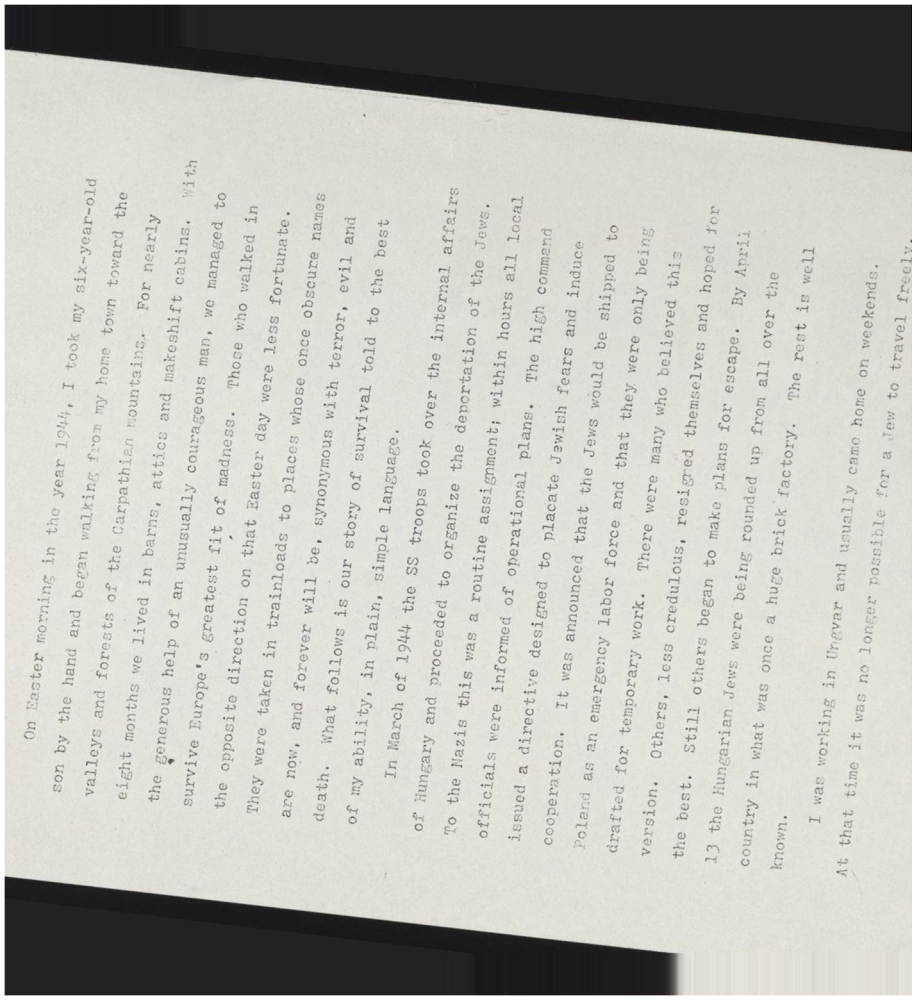

In [93]:
fixed = deskew(image)
cv2.imwrite("rotated_fixed.jpg", fixed)
display("rotated_fixed.jpg")